#Carga de archivos y librerías

In [ ]:
!gdown -q --fuzzy https://drive.google.com/file/d/13v1cHMDTF6yhOFHWzXp7mE9k0w8PxPY1/view?usp=sharing
!unzip -q /content/flower_images.zip 

In [ ]:
!python --version

Python 3.7.14


In [ ]:
import numpy as np
import pandas as pd
import cv2 as cv 
from google.colab.patches import cv2_imshow # for image display
from skimage import io
from PIL import Image 
import matplotlib.pylab as plt
from sklearn.decomposition import PCA
import seaborn as sns

In [ ]:
labels = pd.read_csv('/content/flower_images/flower_labels.csv')

In [ ]:
label_dict = {0: 'phlox',
              1: 'rose',
              2: 'calendula',
              3: 'iris',
              4: 'leucanthemum maximum',
              5: 'campanula',
              6: 'viola',
              7: 'rudbeckia laciniata',
              8: 'peony',
              9: 'aquilegia'}

In [ ]:
labels['label'] = labels.label.map(label_dict)

#Exploración

##Color, valor, rango, tamaño, etc.

In [ ]:
labels.head()

,file,label
0,0001.png,phlox
1,0002.png,phlox
2,0003.png,calendula
3,0004.png,phlox
4,0005.png,phlox


In [ ]:
labels.label.value_counts()

peony                   26
campanula               25
viola                   23
iris                    22
phlox                   21
leucanthemum maximum    21
rose                    20
calendula               19
aquilegia               18
rudbeckia laciniata     15
Name: label, dtype: int64

In [ ]:
width = []
height = []
channels = []
for im in labels.file:
  img = cv.imread('/content/flower_images/' + im)
  h,w,c = img.shape
  height.append(h)
  width.append(w)
  channels.append(c)
labels['height'] = height
labels['width'] = width
labels['channels'] = channels


In [ ]:
labels[['height','width','channels']].describe()

,height,width,channels
count,210.000000,210.000000,210.0
mean,128.380952,128.380952,3.0
std,5.520524,5.520524,0.0
min,128.000000,128.000000,3.0
25%,128.000000,128.000000,3.0
50%,128.000000,128.000000,3.0
75%,128.000000,128.000000,3.0
max,208.000000,208.000000,3.0


In [ ]:
labels.height.value_counts()

128    209
208      1
Name: height, dtype: int64

In [ ]:
labels.width.value_counts()

128    209
208      1
Name: width, dtype: int64

In [ ]:
labels[labels.height == 208]

,file,label,height,width,channels
207,0208.png,leucanthemum maximum,208,208,3


In [ ]:
min_blue = []
max_blue = []
min_green = []
max_green = []
min_red = []
max_red = []
for im in labels.file:
  img = cv.imread('/content/flower_images/' + im)
  #img = cv.cvtColor(img, cv.COLOR_BGR2RGB)
  min_blue.append(img[:,:,0].min())
  max_blue.append(img[:,:,0].max())
  min_green.append(img[:,:,1].min())
  max_green.append(img[:,:,1].max())
  min_red.append(img[:,:,2].min())
  max_red.append(img[:,:,2].max())
labels['min_blue'] = pd.Series(min_blue, dtype = 'UInt8')
labels['max_blue'] = pd.Series(max_blue, dtype = 'UInt8')
labels['min_green'] = pd.Series(min_green, dtype = 'UInt8')
labels['max_green'] = pd.Series(max_green, dtype = 'UInt8')
labels['min_red'] = pd.Series(min_red, dtype = 'UInt8')
labels['max_red'] = pd.Series(max_red, dtype = 'UInt8')

In [ ]:
labels[['min_blue','min_green','min_red','max_blue','max_green','max_red']].describe()

,min_blue,min_green,min_red,max_blue,max_green,max_red
count,210.000000,210.000000,210.000000,210.000000,210.000000,210.000000
mean,0.147619,0.195238,0.361905,235.452381,247.780952,252.066667
std,1.559695,1.557503,2.398659,33.526967,12.559890,7.525735
min,0.000000,0.000000,0.000000,86.000000,199.000000,217.000000
25%,0.000000,0.000000,0.000000,231.000000,245.000000,254.250000
50%,0.000000,0.000000,0.000000,254.000000,255.000000,255.000000
75%,0.000000,0.000000,0.000000,255.000000,255.000000,255.000000
max,22.000000,19.000000,24.000000,255.000000,255.000000,255.000000


##Gráficos

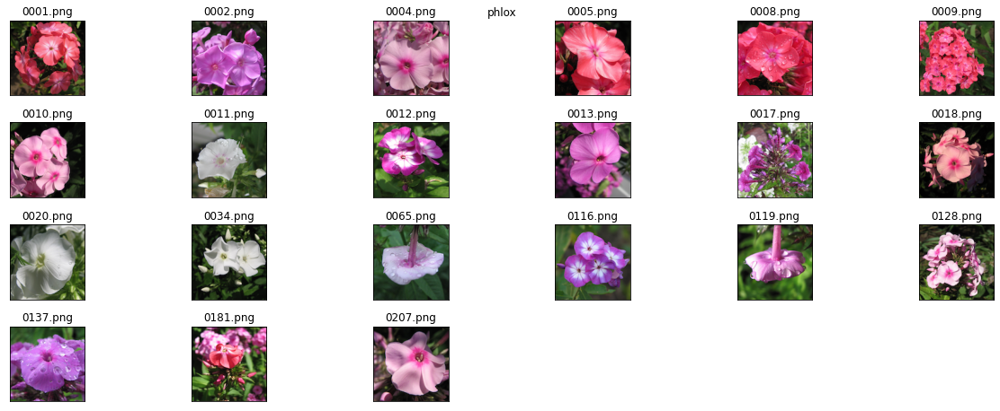

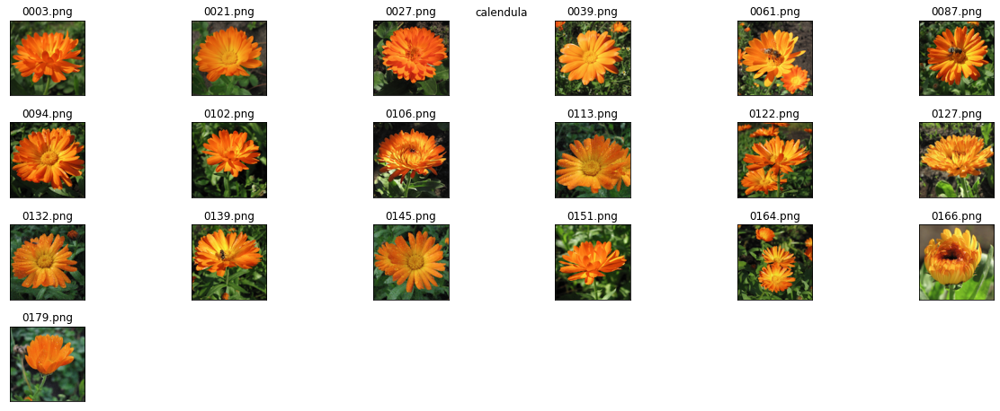

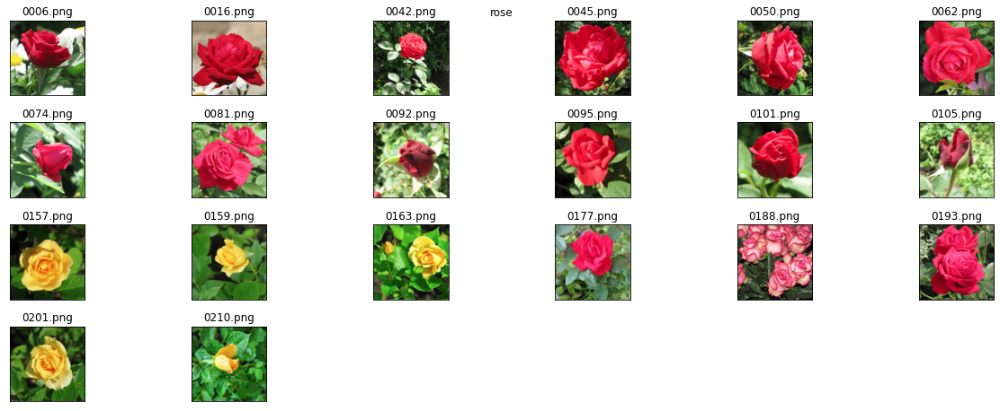

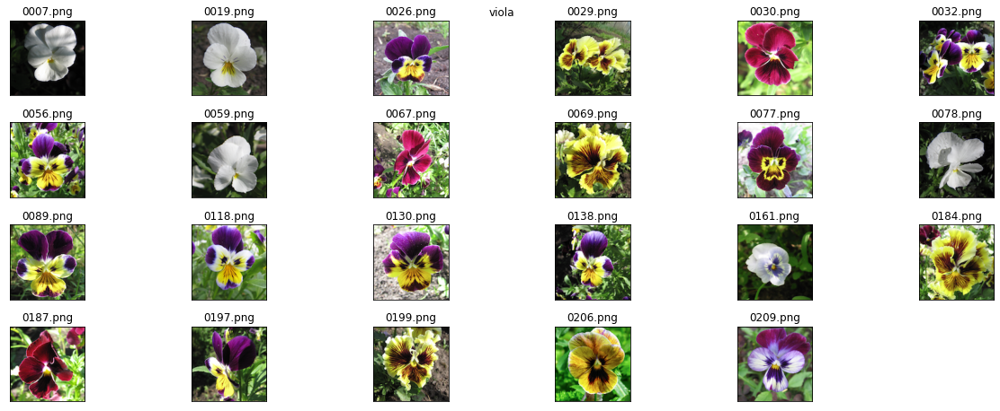

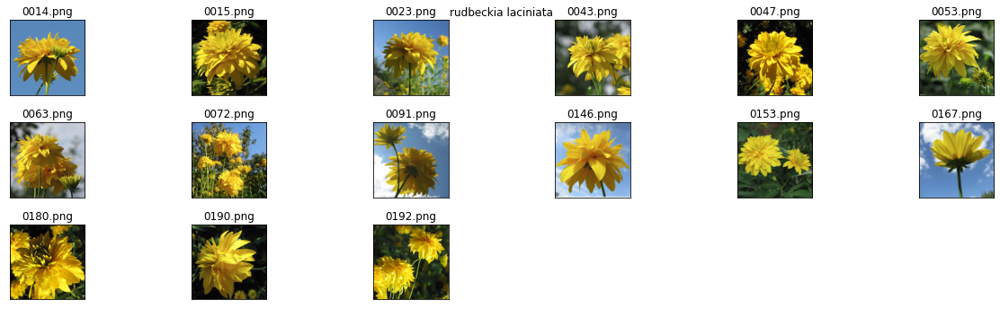

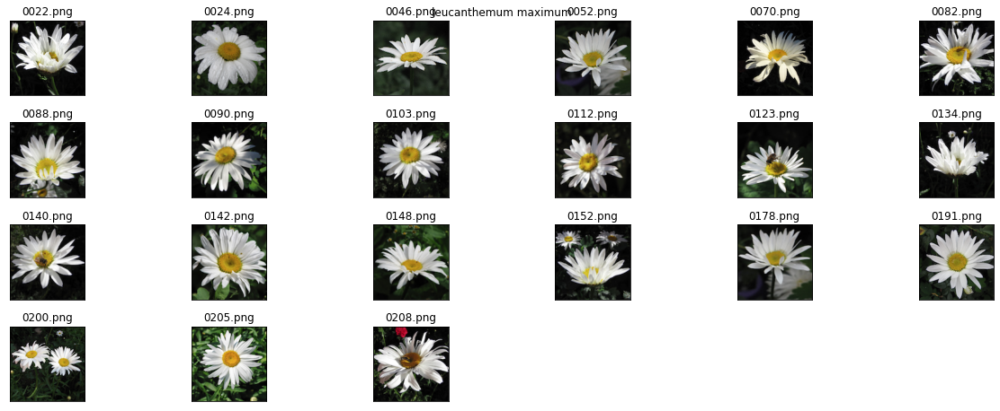

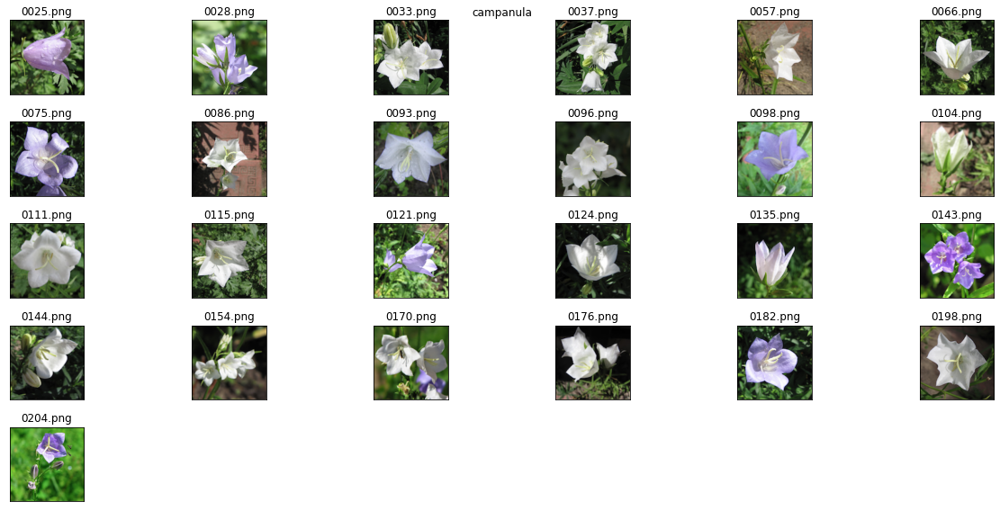

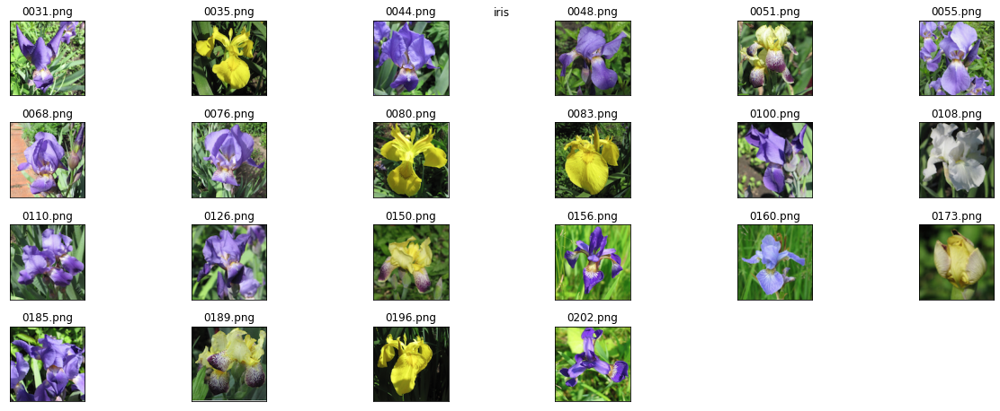

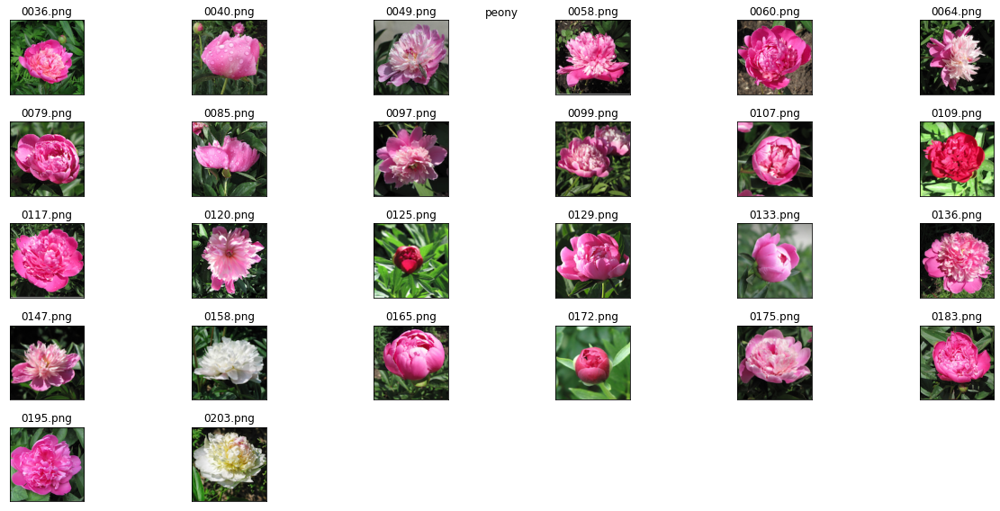

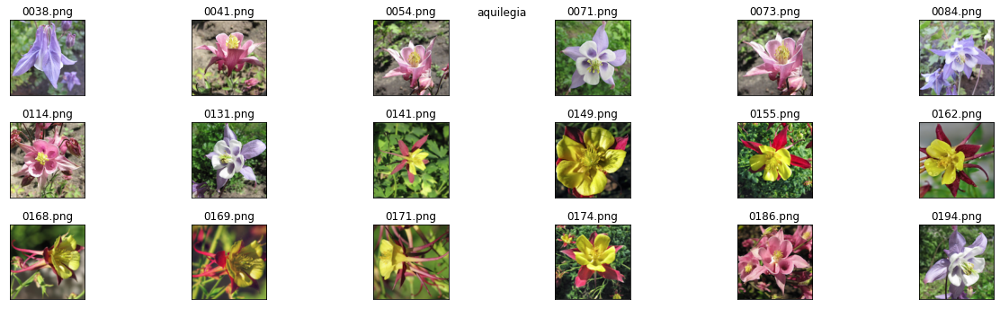

In [ ]:
##Intensidad
for species in labels.label.unique():
  plt.figure(figsize=(17,8))
  plt.suptitle(species)
  #plt.title('phlox')
  for i,im in enumerate(labels[labels.label == species].file):
    plt.subplot(5,6,i+1)
    img = cv.imread('/content/flower_images/' + im)
    img = cv.cvtColor(img, cv.COLOR_BGR2RGB)
    plt.title(im)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(img)
  plt.tight_layout()

In [ ]:
(labels[labels.label == 'rose'].file).iloc[0]

'0006.png'

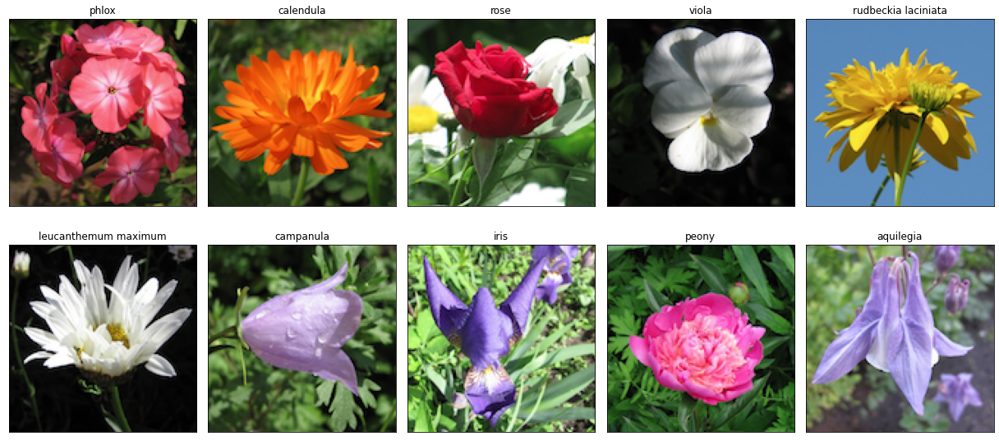

In [ ]:
plt.figure(figsize=(17,8))
for i,species in enumerate(labels.label.unique()):
  plt.subplot(2,5,i+1)
  im = (labels[labels.label == species].file).iloc[0]
  img = cv.imread('/content/flower_images/' + im)
  img = cv.cvtColor(img, cv.COLOR_BGR2RGB)
  plt.imshow(img)
  plt.title(species)
  plt.xticks([])
  plt.yticks([])
  plt.grid(False)
plt.tight_layout()

#Transformaciones

##Recorte de círculo central

In [ ]:
img = cv.imread('/content/flower_images/0081.png')

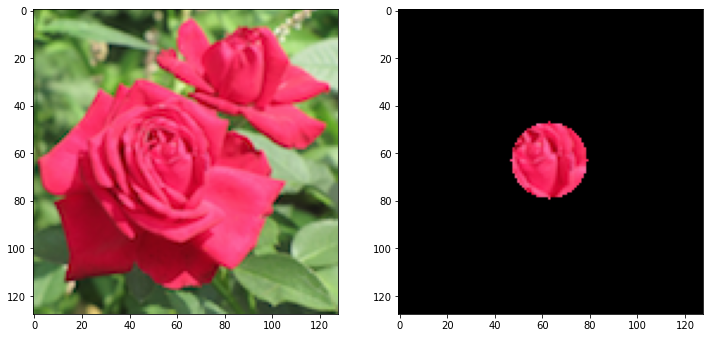

In [ ]:
mask = np.zeros(img.shape[:2], dtype="uint8")
cv.circle(mask, (63, 63), 16, 255, -1)
masked = cv.bitwise_and(img, img, mask=mask)
masked = cv.cvtColor(masked, cv.COLOR_BGR2RGB)
img = cv.cvtColor(img, cv.COLOR_BGR2RGB)
plt.figure(figsize=(12,6))
plt.subplot(1,2,1)
plt.imshow(img)
plt.subplot(1,2,2)
plt.imshow(masked);

##Mezcla de píxeles

In [ ]:
img = cv.imread('/content/flower_images/0097.png')
#img = cv.imread('/content/flower_images/0158.png')

In [ ]:
(img.reshape(128*128,3))[:,1].shape

(16384,)

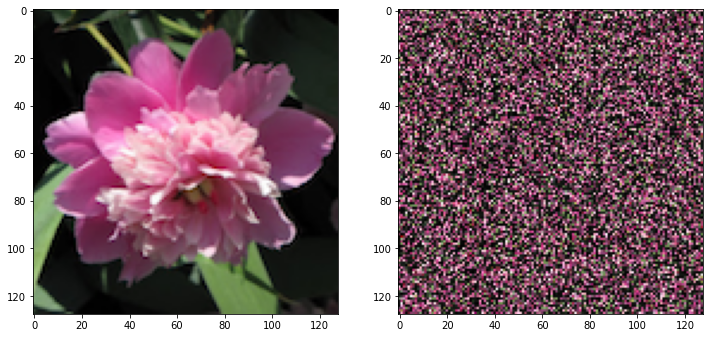

In [ ]:
imgshuffled = img.reshape(128*128,3).copy()
index = np.arange(128*128)
np.random.shuffle(index)
imgshuffled = imgshuffled[index,:]
imgshuffled = imgshuffled.reshape(128,128,3)
imgshuffled = cv.cvtColor(imgshuffled, cv.COLOR_BGR2RGB)
img = cv.cvtColor(img, cv.COLOR_BGR2RGB)
plt.figure(figsize=(12,6))
plt.subplot(1,2,1)
plt.imshow(img)
plt.subplot(1,2,2)
plt.imshow(imgshuffled);

##Mezcla de imágenes

In [ ]:
img1 = cv.imread('/content/flower_images/0081.png')
img2 = cv.imread('/content/flower_images/0097.png')
img3 = cv.imread('/content/flower_images/0158.png')
img4 = cv.imread('/content/flower_images/0030.png')

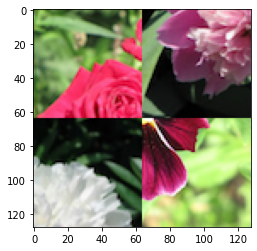

In [ ]:
imgmix = np.zeros((128,128,3))
#imgmix[0:64,0:64,:] = img1[0:64,0:64,:]
#imgmix[64:128,0:64,:] = img2[64:128,0:64,:]
#imgmix[0:64,64:128,:] = img3[0:64,64:128,:]
#imgmix[64:128,64:128,:] = img4[64:128,64:128,:]
imgmix = np.vstack([np.hstack([img1[0:64,0:64,:],img2[64:128,0:64,:]]),np.hstack([img3[0:64,64:128,:],img4[64:128,64:128,:]])])
imgmix = cv.cvtColor(imgmix, cv.COLOR_BGR2RGB)
plt.imshow(imgmix)

##Intensidad
Cambiar la intensidad de una de las imágenes en escala de grises, transformarla en una
imagen con mucho y otra con poco brillo.

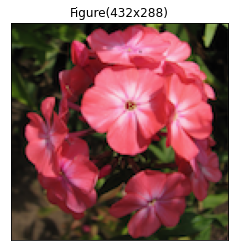

In [ ]:
im = plt.figure()
img = cv.imread('/content/flower_images/0001.png')
img_original = cv.cvtColor(img, cv.COLOR_BGR2RGB)
plt.title(im)
plt.xticks([])
plt.yticks([])
plt.grid(False)
plt.imshow(img_original);

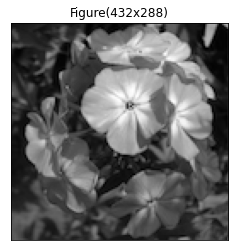

In [ ]:
#imagen en escala de grises
im = plt.figure()
img = cv.imread('/content/flower_images/0001.png')
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
plt.title(im)
plt.xticks([])
plt.yticks([])
plt.grid(False)
#plt.imshow(gray)
plt.imshow(gray, cmap='gray');

In [ ]:
gray.shape

(128, 128)

/usr/local/lib/python3.7/dist-packages/matplotlib/text.py:1165: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


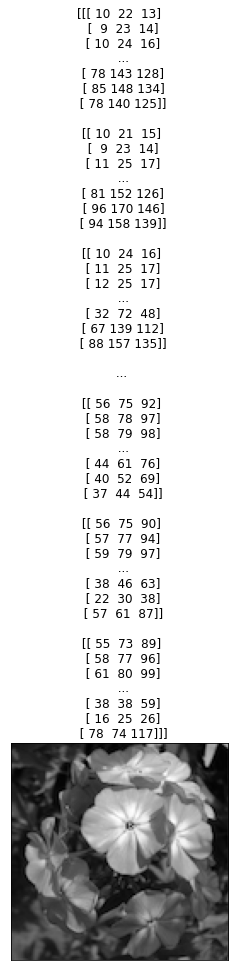

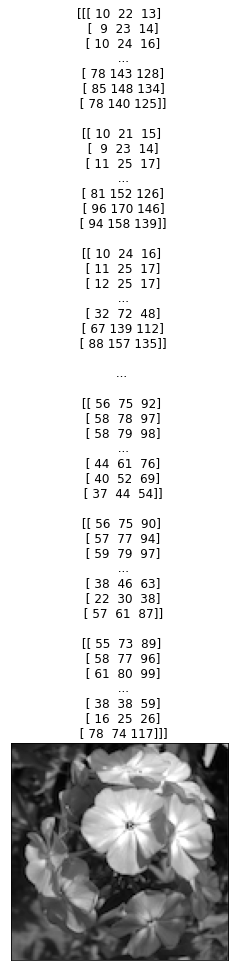

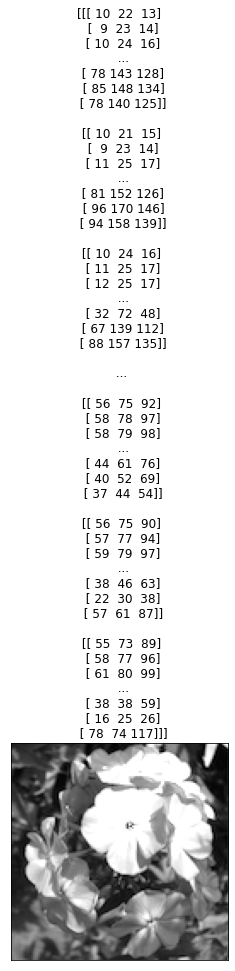

In [ ]:
#cambiar brillo, 
def increase_brightness(img, value=30):
    gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

    lim = 255 - value
    gray[gray > lim] = 255
    gray[gray <= lim] += value


    return gray
img = cv.imread('/content/flower_images/0001.png')
for v in [20,50,100]:

  gray_brighter = increase_brightness(img, value=v)
  plt.title(img)
  plt.xticks([])
  plt.yticks([])
  plt.grid(False)
  plt.imshow(gray_brighter, cmap='gray')
  plt.show()

/usr/local/lib/python3.7/dist-packages/matplotlib/text.py:1165: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


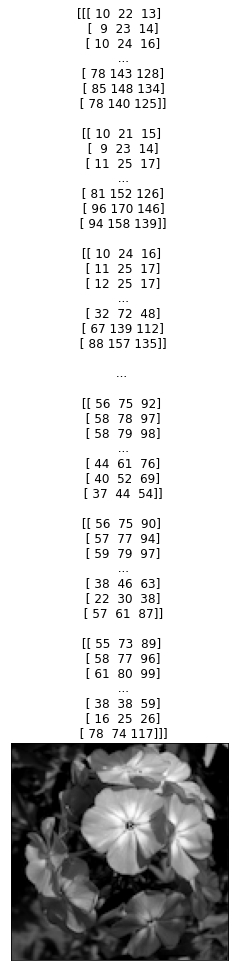

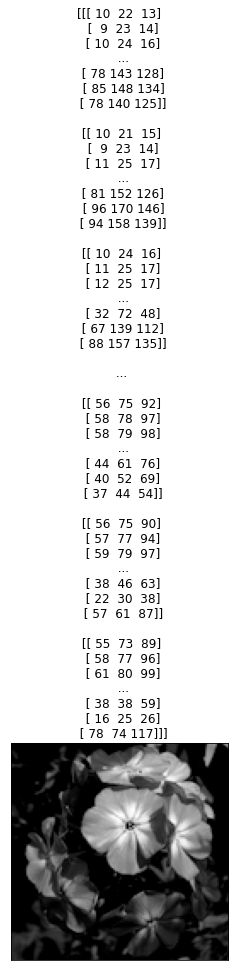

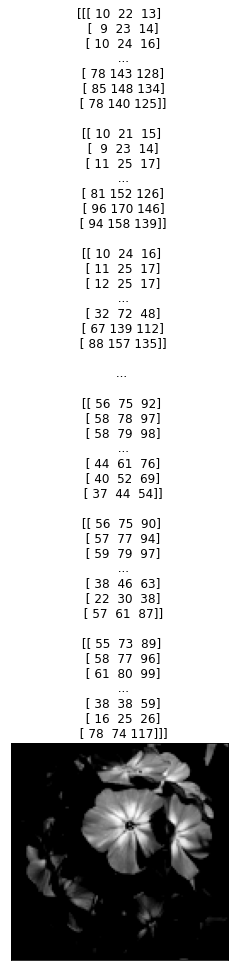

In [ ]:
#cambiar brillo, 
def decrease_brightness(img, value=30):
    gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

    lim = 0 + value
    gray[gray < lim] = 0
    gray[gray >= lim] -= value

    return gray
img = cv.imread('/content/flower_images/0001.png')
for v in [20,50,100]:

  gray_brighter = decrease_brightness(img, value=v)
  plt.title(img)
  plt.xticks([])
  plt.yticks([])
  plt.grid(False)
  plt.imshow(gray_brighter, cmap='gray')
  plt.show()

In [ ]:
#tambien puedo trabajar por canal
for (name, chan) in zip(("B", "G", "R"), cv.split(img)):
  plt.title(name)
  plt.xticks([])
  plt.yticks([])
  plt.grid(False)
  plt.imshow(chan)
  plt.show()

In [ ]:
#cambiar brillo, 
def increase_brightness(img, value=30):
    img_original = cv.cvtColor(img, cv.COLOR_BGR2RGB)
    h, s, v = cv.split(img_original)

    lim = 255 - value
    v[v > lim] = 255
    v[v <= lim] += value


    final_hsv = cv.merge((h, s, v))
    img = cv.cvtColor(final_hsv, cv.COLOR_BGR2GRAY)
    return img

img = cv.imread('/content/flower_images/0001.png')
for v in [20,50,100]:

  gray_brighter = increase_brightness(img, value=v)
  plt.title(img)
  plt.xticks([])
  plt.yticks([])
  plt.grid(False)
  plt.imshow(gray_brighter, cmap='gray')
  plt.show()

##Blanco y Negro
Convertir una de las imágenes a blanco y negro (binario). ¿Es la única manera? Si
existen otras transformaciones mostrar más de una conversión

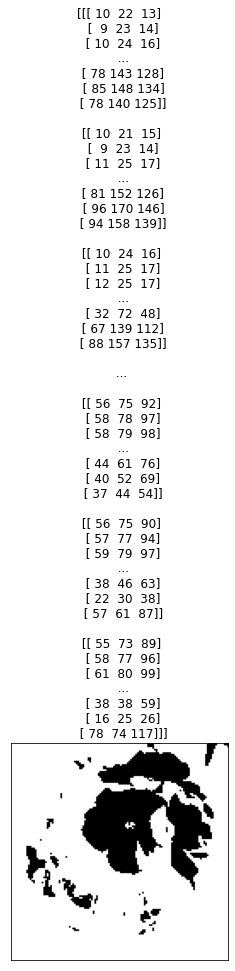

In [ ]:
img = cv.imread('/content/flower_images/0001.png')
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
(thresh, blackAndWhiteImage) = cv.threshold(gray, 127, 255, cv.THRESH_BINARY)
 
plt.title(img)
plt.xticks([])
plt.yticks([])
plt.grid(False)
plt.imshow(blackAndWhiteImage, cmap='gray')

/usr/local/lib/python3.7/dist-packages/matplotlib/text.py:1165: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


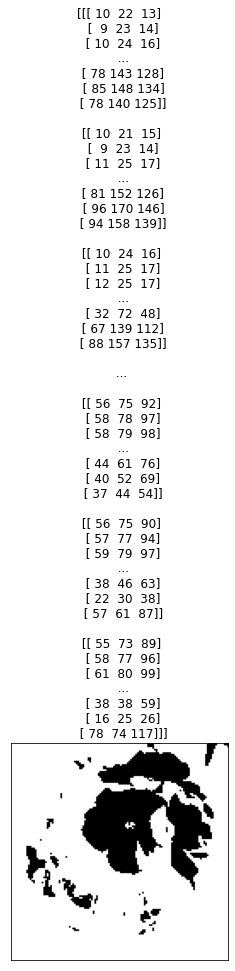

In [ ]:
img = cv.imread('/content/flower_images/0001.png')
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
(thresh, blackAndWhiteImage) = cv.threshold(gray, 127, 255, cv.THRESH_BINARY_INV)
 
plt.title(img)
plt.xticks([])
plt.yticks([])
plt.grid(False)
plt.imshow(blackAndWhiteImage, cmap='gray')

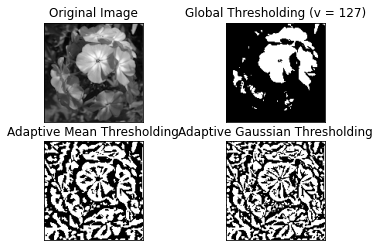

In [ ]:
img = cv.imread('/content/flower_images/0001.png')
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
ret,th1 = cv.threshold(gray,127,255,cv.THRESH_BINARY)
th2 = cv.adaptiveThreshold(gray,255,cv.ADAPTIVE_THRESH_MEAN_C,cv.THRESH_BINARY,11,2)
th3 = cv.adaptiveThreshold(gray,255,cv.ADAPTIVE_THRESH_GAUSSIAN_C,cv.THRESH_BINARY,11,2)
titles = ['Original Image', 'Global Thresholding (v = 127)','Adaptive Mean Thresholding', 'Adaptive Gaussian Thresholding']
images = [gray, th1, th2, th3]
for i in range(4):
    plt.subplot(2,2,i+1),plt.imshow(images[i],'gray')
    plt.title(titles[i])
    plt.xticks([]),plt.yticks([])
plt.show()

## Filtros


Aplicar dos tipos diferentes de filtros sobre una imagen, explique en qué casos convieneusar cada uno.

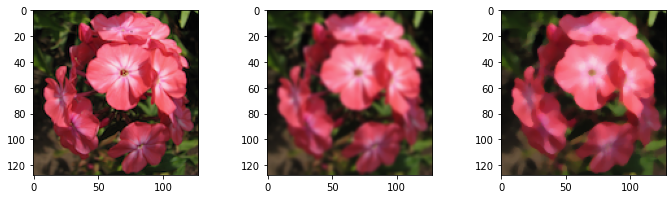

In [ ]:
plt.figure(figsize=(10,8))
#plt.title('phlox')
img = cv.imread('/content/flower_images/' + '0001.png')
img = cv.cvtColor(img, cv.COLOR_BGR2RGB)

#blur = cv.blur(img,(5,5))
#bilateral = cv.bilateralFilter(img,9,75,75)
#box = cv.boxFilter(img, 0, (7,7), img, (-1,-1), False, cv.BORDER_DEFAULT)
gaussianblur =  cv.GaussianBlur(img,(5,5),0)
median = cv.medianBlur(img,5)

plt.title(img)
plt.xticks([])
plt.yticks([])
plt.grid(False)

plt.subplot(3,3,1)
plt.imshow(img)

plt.subplot(3,3,2)
plt.imshow(gaussianblur)

plt.subplot(3,3,3)
plt.imshow(median)


plt.tight_layout()

##Promedio

Calcular imagen promedio global y el promedio entre las distintas especies. ¿Se puedendistinguir los promedios? ¿Cómo quedan los promedios si consideran las imágenes en blanco y negro

In [ ]:
def average_image(image_list):
  image_data = []
  for img in image_list:
    this_image = cv.imread('/content/flower_images/' + img)
    this_image = cv.cvtColor(this_image, cv.COLOR_BGR2RGB)
    if (img == "0208.png"):
      this_image = cv.resize(this_image, (128,128))
    image_data.append(this_image)

  avg_image = image_data[0]
  for i in range(1,len(image_data)):
        alpha = 1.0/(i + 1)
        beta = 1.0 - alpha
        avg_image = cv.addWeighted(image_data[i], alpha, avg_image, beta, 0.0)

  return avg_image

###Global

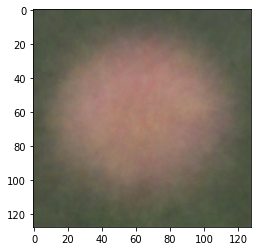

In [ ]:
avg_image = average_image(labels.file)

cv.imwrite('avg_flower.png', avg_image)
avg_image = cv.imread('avg_flower.png')
plt.imshow(avg_image)
plt.show()

###Por especie

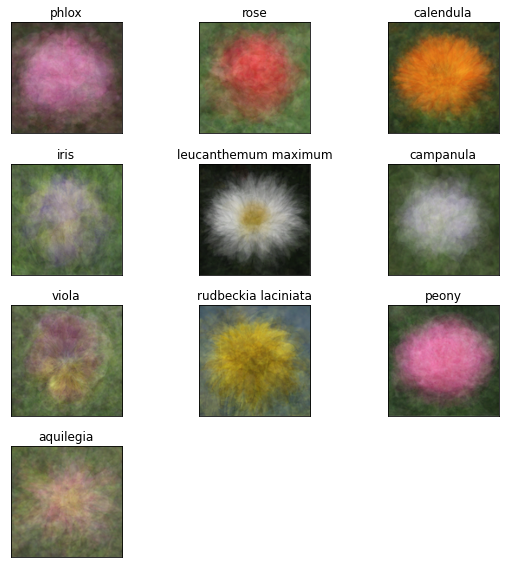

In [ ]:
plt.figure(figsize=(8,8))
for i, genera in enumerate(label_dict.values()):
  genera_list = labels.loc[labels['label'] == genera].file
  avg_image = average_image(genera_list)
  cv.imwrite('avg_flower' + genera + '.png', avg_image)
  plt.subplot(4,3,i+1)
  avg_image = cv.imread('avg_flower' + genera + '.png')
  plt.title(genera)
  plt.xticks([])
  plt.yticks([])
  plt.grid(False)
  plt.imshow(avg_image)
plt.tight_layout();


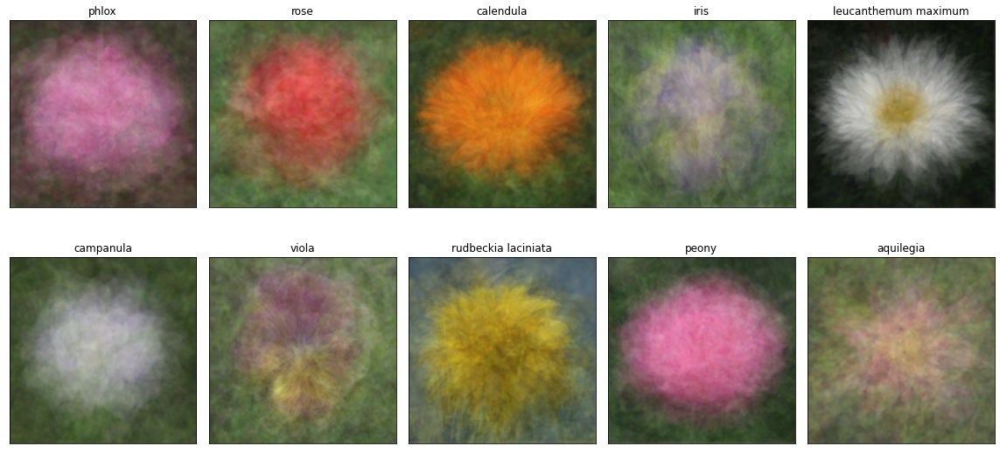

In [ ]:
plt.figure(figsize=(16,8))
for i, genera in enumerate(label_dict.values()):
  genera_list = labels.loc[labels['label'] == genera].file
  avg_image = average_image(genera_list)
  cv.imwrite('avg_flower' + genera + '.png', avg_image)
  plt.subplot(2,5,i+1)
  avg_image = cv.imread('avg_flower' + genera + '.png')
  plt.title(genera)
  plt.xticks([])
  plt.yticks([])
  plt.grid(False)
  plt.imshow(avg_image)
plt.tight_layout();

###En blanco y negro

In [ ]:
def average_image_gray(image_list):
  image_data = []
  for img in image_list:
    this_image = cv.imread('/content/flower_images/' + img)
    if (img == "0208.png"):
      this_image = cv.resize(this_image, (128,128))
    image_data.append(this_image)

  avg_image = cv.cvtColor(image_data[0], cv.COLOR_BGR2GRAY)
  for i in range(1,len(image_data)):
      alpha = 1.0/(i + 1)
      beta = 1.0 - alpha
      image_data[i] = cv.cvtColor(image_data[i], cv.COLOR_BGR2GRAY)
      avg_image = cv.addWeighted(image_data[i], alpha, avg_image, beta, 0.0)

  return avg_image

###Global

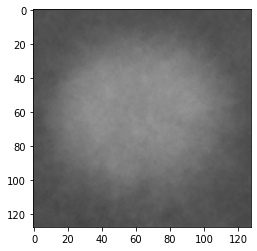

In [ ]:
avg_image = average_image_gray(labels.file)

cv.imwrite('avg_flower_gray.png', avg_image)
avg_image = cv.imread('avg_flower_gray.png')
plt.imshow(avg_image)
plt.show()

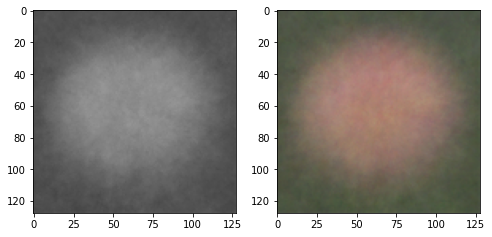

In [ ]:
plt.figure(figsize=(8,8))
plt.subplot(1,2,1)
avg_image = average_image_gray(labels.file)

cv.imwrite('avg_flower_gray.png', avg_image)
avg_image = cv.imread('avg_flower_gray.png')
plt.imshow(avg_image)
#plt.show()

plt.subplot(1,2,2)
avg_image = average_image(labels.file)

cv.imwrite('avg_flower.png', avg_image)
avg_image = cv.imread('avg_flower.png')
plt.imshow(avg_image)
plt.show()

###Por especie

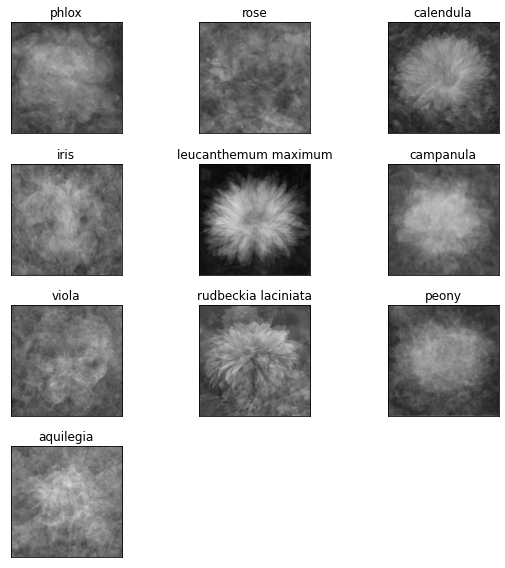

In [ ]:
plt.figure(figsize=(8,8))
for i, genera in enumerate(label_dict.values()):
  genera_list = labels.loc[labels['label'] == genera].file
  avg_image_gray = average_image_gray(genera_list)
  cv.imwrite('avg_flower_gray' + genera + '.png', avg_image_gray)
  plt.subplot(4,3,i+1)
  avg_image_gray = cv.imread('avg_flower_gray' + genera + '.png')
  plt.title(genera)
  plt.xticks([])
  plt.yticks([])
  plt.grid(False)
  plt.imshow(avg_image_gray)
plt.tight_layout()


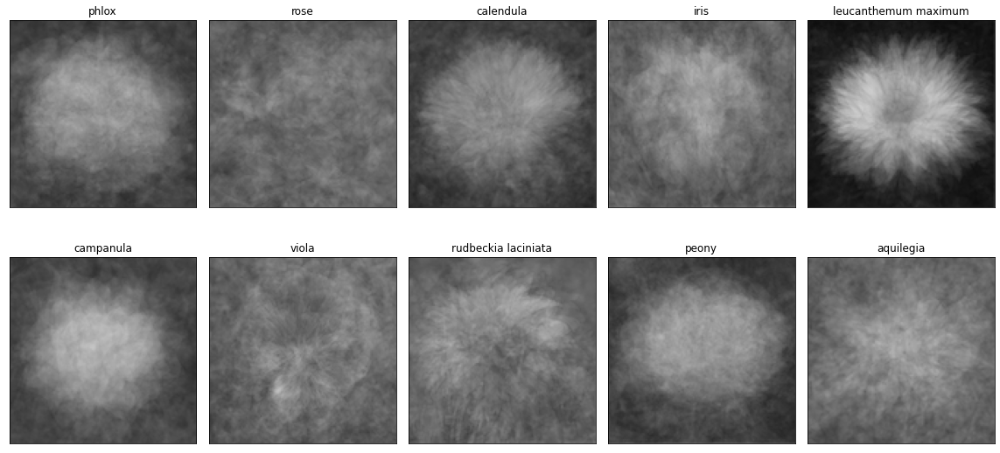

In [ ]:
plt.figure(figsize=(16,8))
for i, genera in enumerate(label_dict.values()):
  genera_list = labels.loc[labels['label'] == genera].file
  avg_image_gray = average_image_gray(genera_list)
  cv.imwrite('avg_flower_gray' + genera + '.png', avg_image_gray)
  plt.subplot(2,5,i+1)
  avg_image_gray = cv.imread('avg_flower_gray' + genera + '.png')
  plt.title(genera)
  plt.xticks([])
  plt.yticks([])
  plt.grid(False)
  plt.imshow(avg_image_gray)
plt.tight_layout()

#Búsqueda de features

##Análisis de componentes principales

In [ ]:
X = []
for i,im in enumerate(labels.file):
  img = cv.imread('/content/flower_images/' + im)
  if (im == '0208.png'):
    img = cv.resize(img, (128,128))
  X.append(img.reshape(128*128*3))
X = np.array(X)

In [ ]:
pca = PCA()
scores = pca.fit_transform(X)

dataframe_dict = {'pc1': scores[:,0],
                  'pc2': scores[:,1],
                  'especie': list(labels.label)}
df = pd.DataFrame(data = dataframe_dict, index = labels.file)

In [ ]:
100 * pca.explained_variance_ratio_

array([15.96731924,  8.61122254])

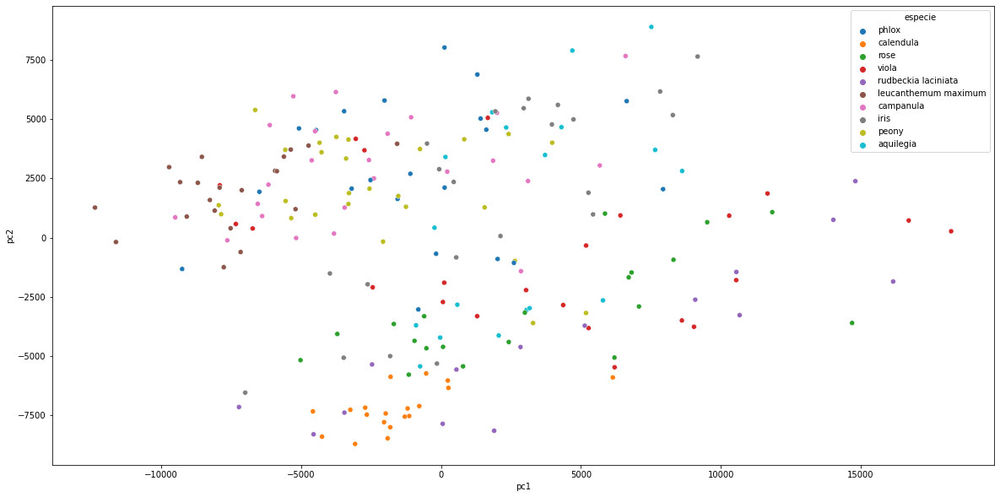

In [ ]:
plt.figure(figsize=(20,10))
sns.scatterplot(data=df, x="pc1", y="pc2", hue="especie");

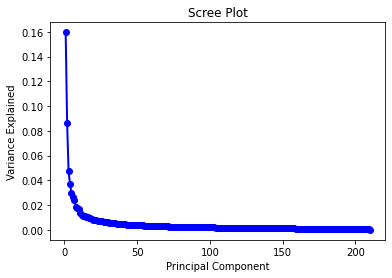

In [ ]:
PC_values = np.arange(pca.n_components_) + 1
plt.plot(PC_values, pca.explained_variance_ratio_, 'o-', linewidth=2, color='blue')
plt.title('Scree Plot')
plt.xlabel('Principal Component')
plt.ylabel('Variance Explained')
plt.show()

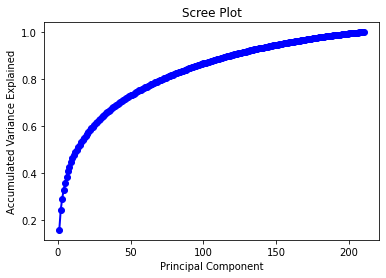

In [ ]:
PC_values = np.arange(pca.n_components_) + 1
plt.plot(PC_values, np.cumsum(pca.explained_variance_ratio_), 'o-', linewidth=2, color='blue')
plt.title('Scree Plot')
plt.xlabel('Principal Component')
plt.ylabel('Accumulated Variance Explained')
plt.show()

## Analisis colores
Analizar las distribuciones de valores de pixels por cada especie. ¿Se puede distinguir
una especie en algún rango de color?


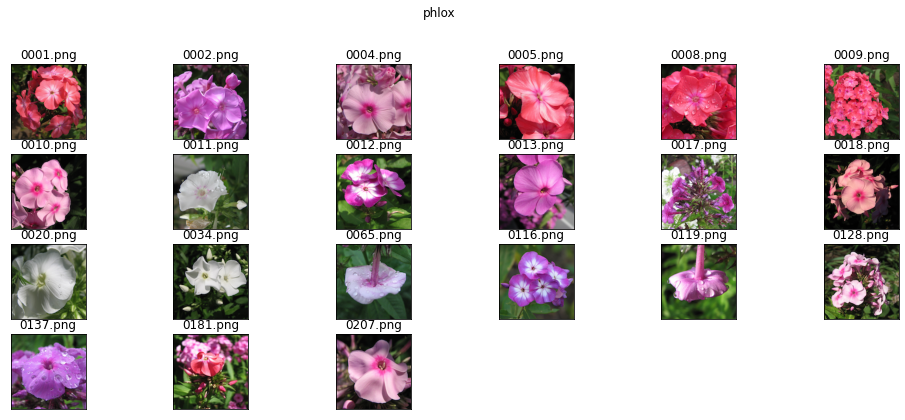

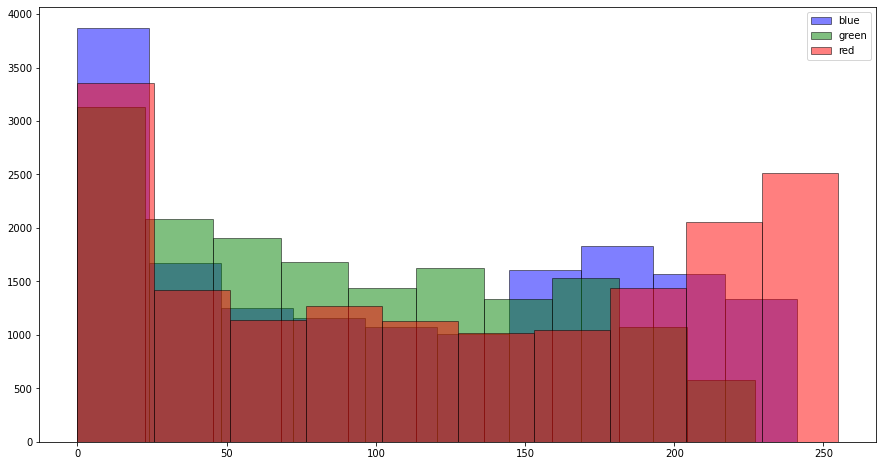

<Figure size 432x288 with 0 Axes>

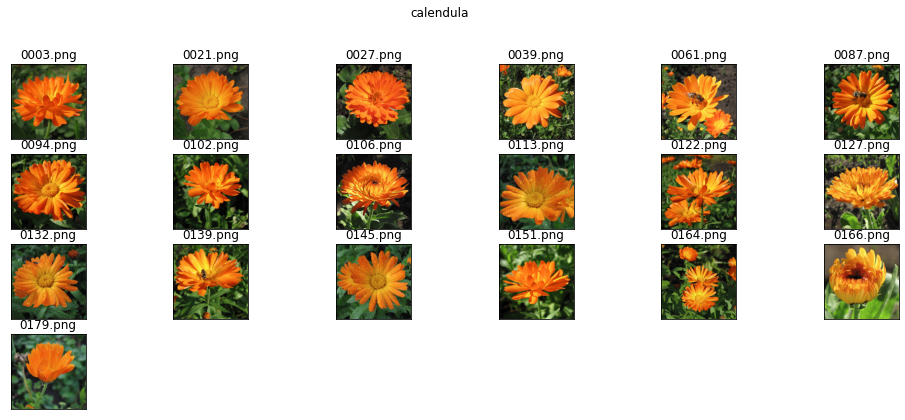

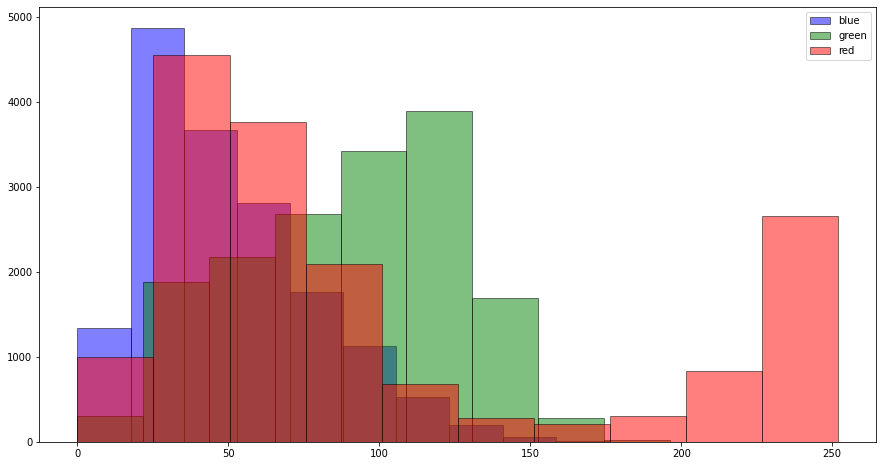

<Figure size 432x288 with 0 Axes>

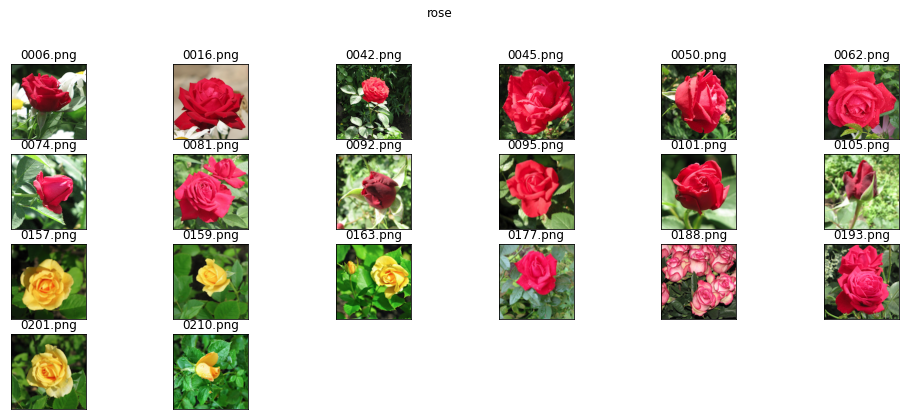

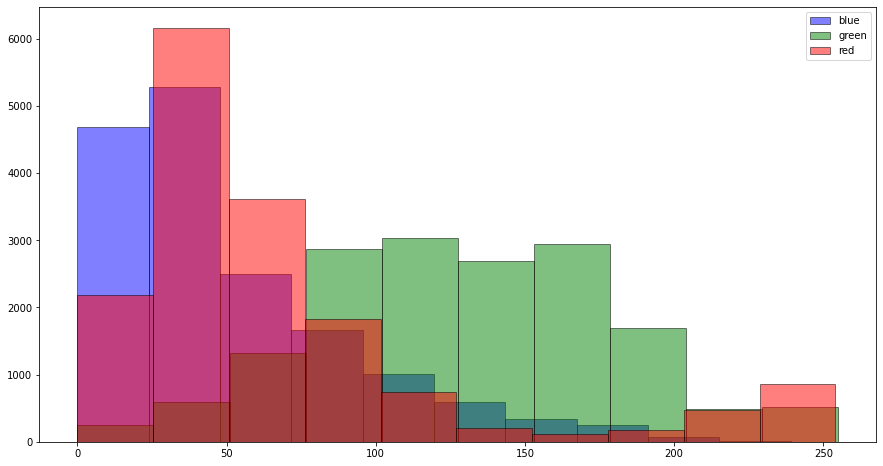

<Figure size 432x288 with 0 Axes>

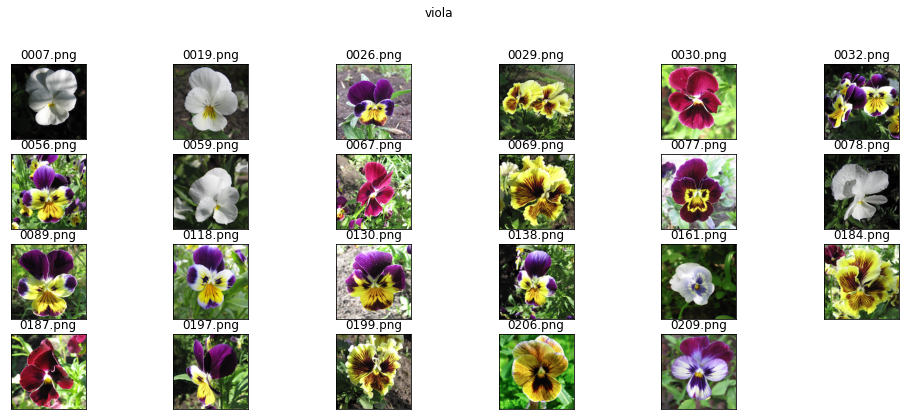

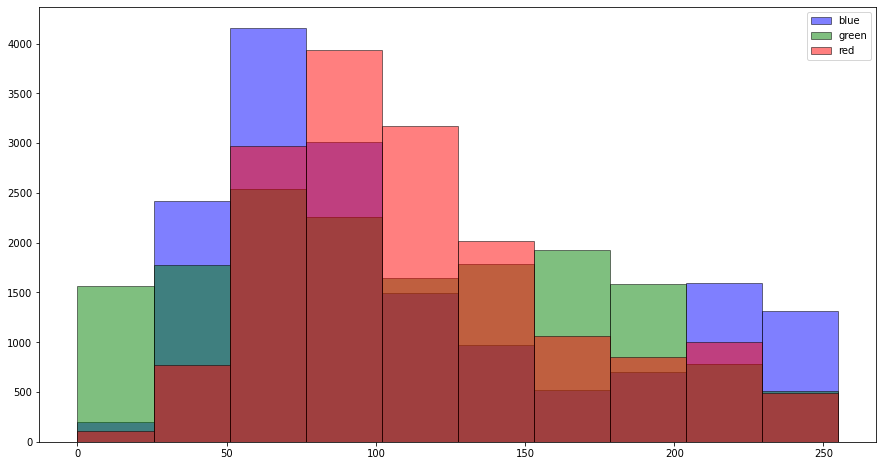

<Figure size 432x288 with 0 Axes>

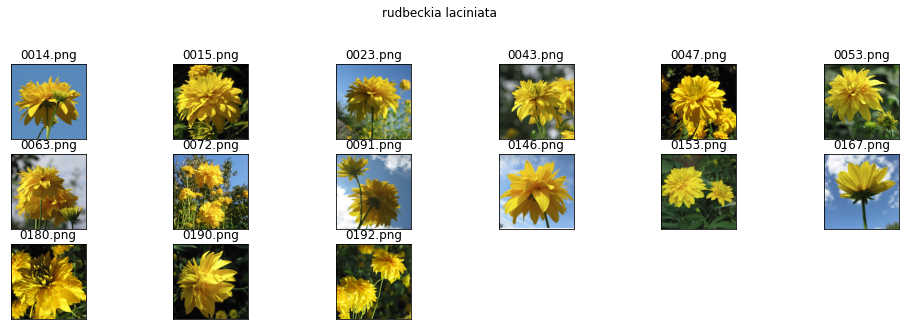

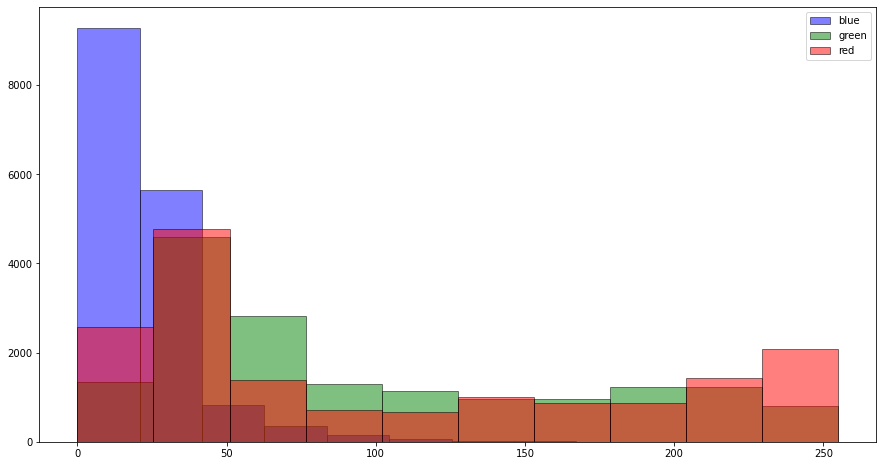

<Figure size 432x288 with 0 Axes>

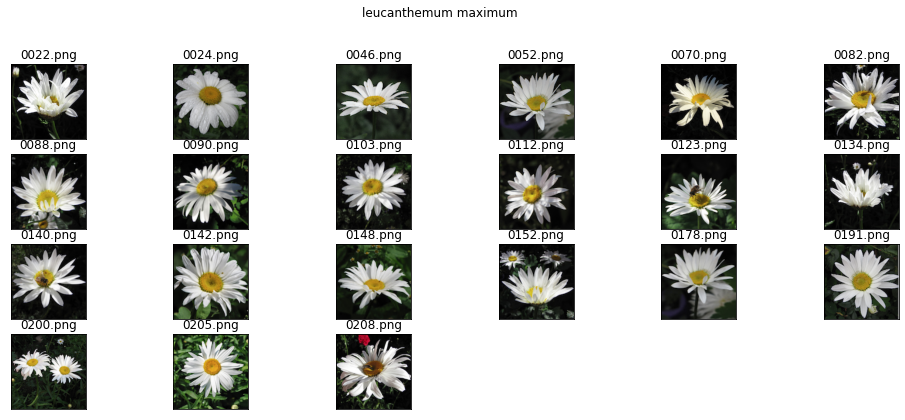

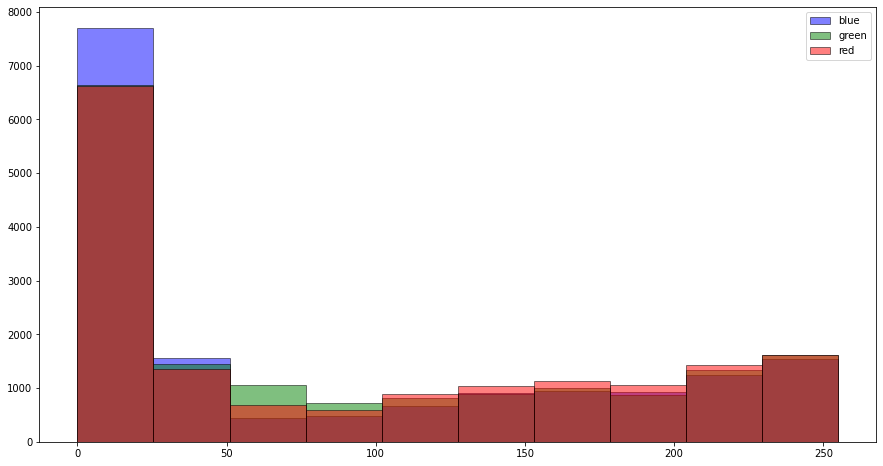

<Figure size 432x288 with 0 Axes>

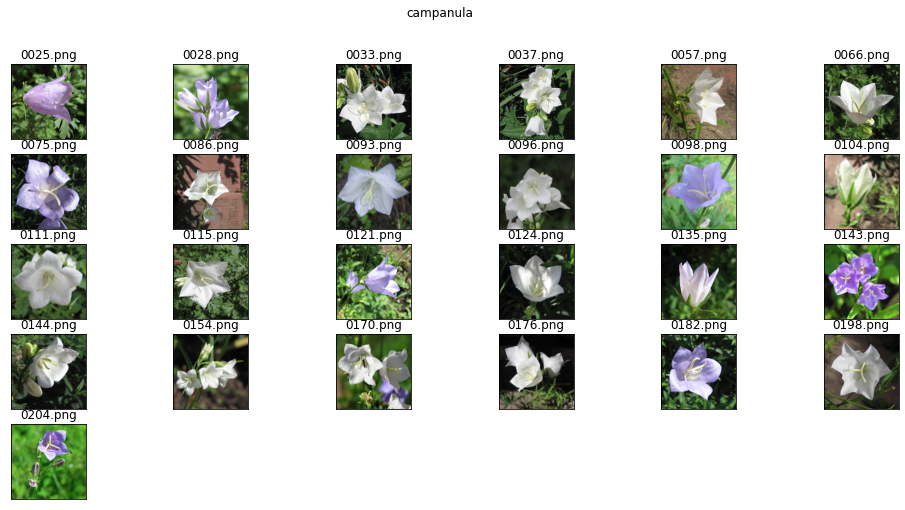

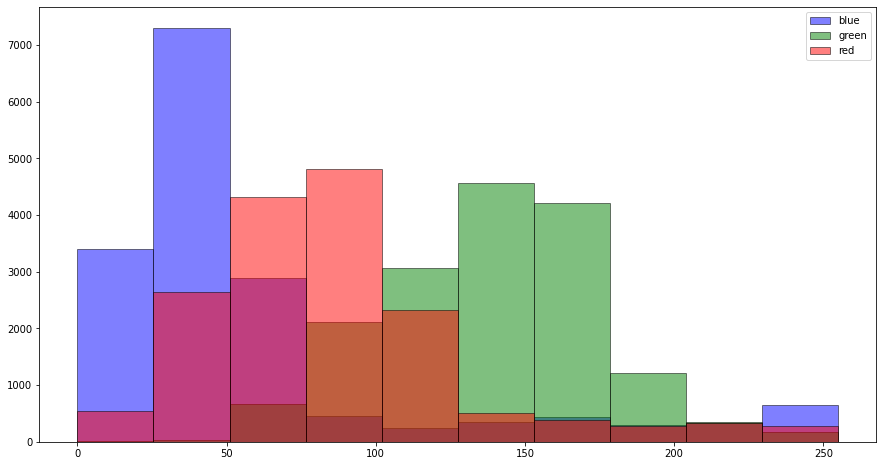

<Figure size 432x288 with 0 Axes>

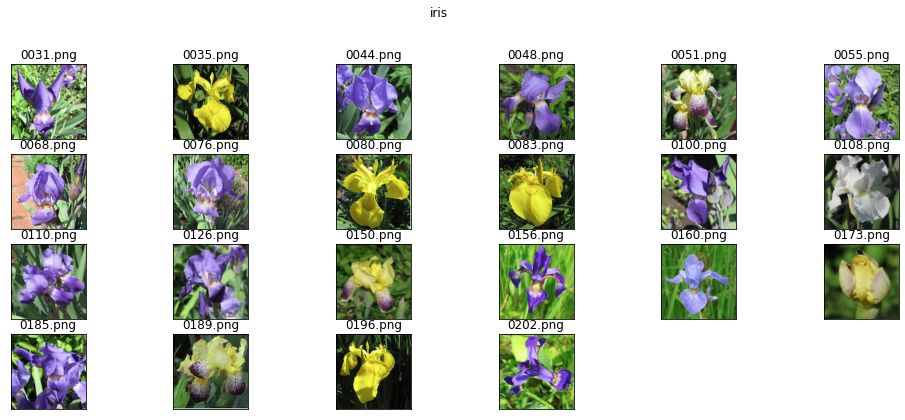

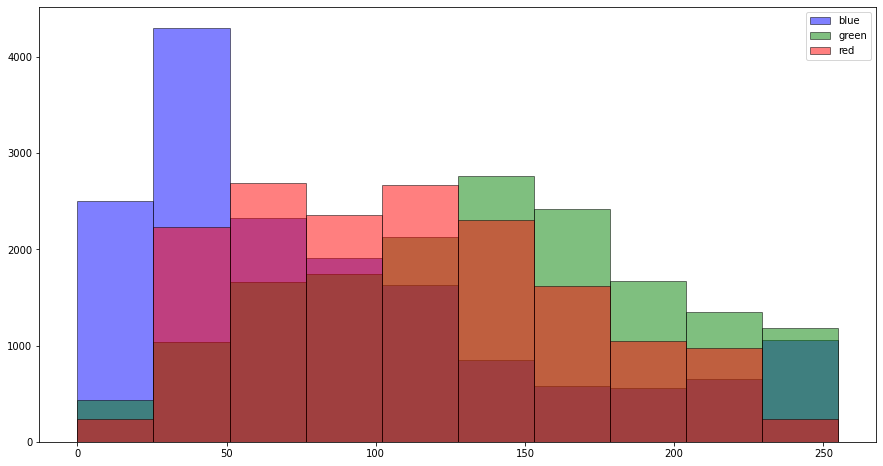

<Figure size 432x288 with 0 Axes>

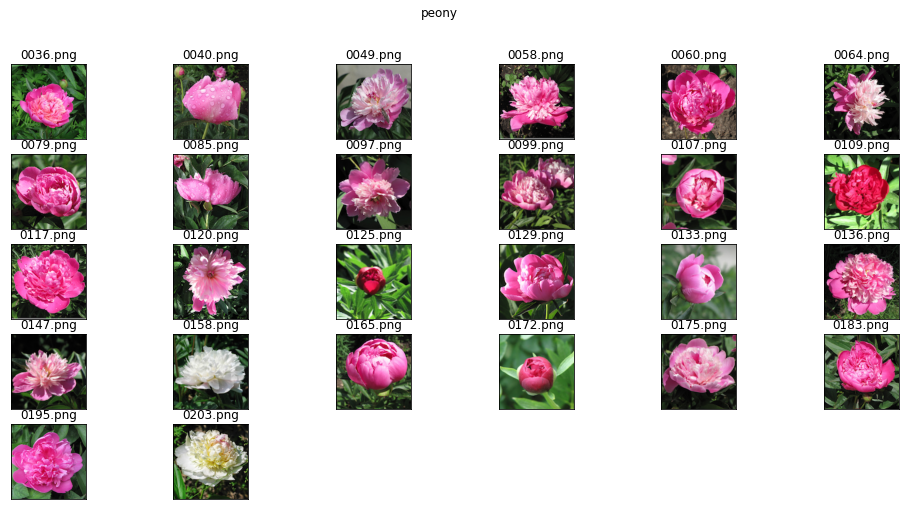

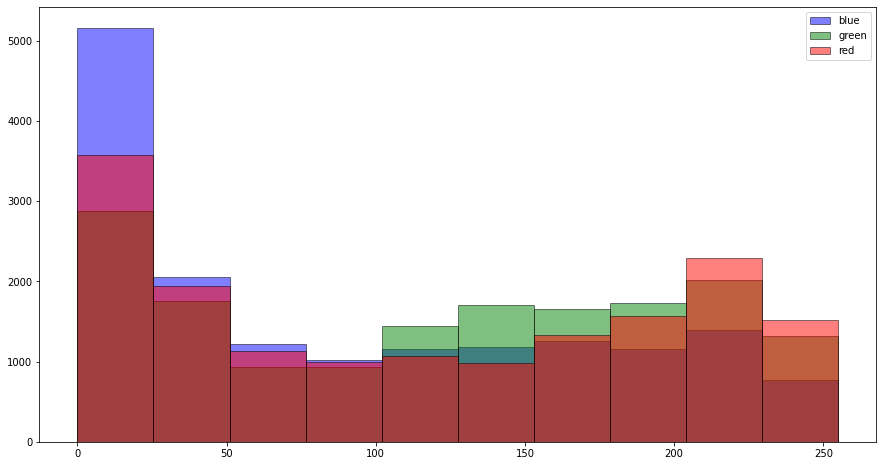

<Figure size 432x288 with 0 Axes>

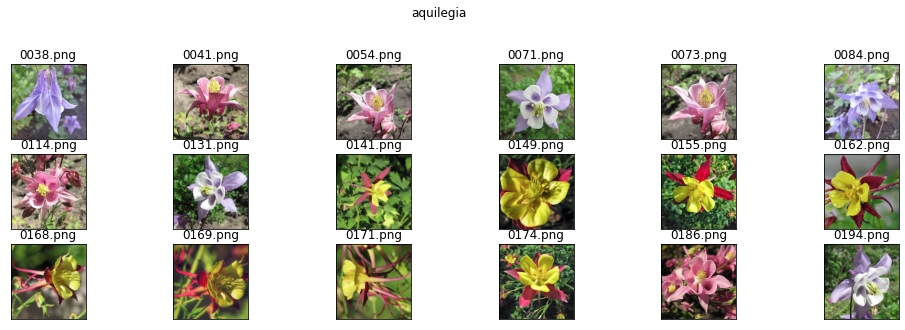

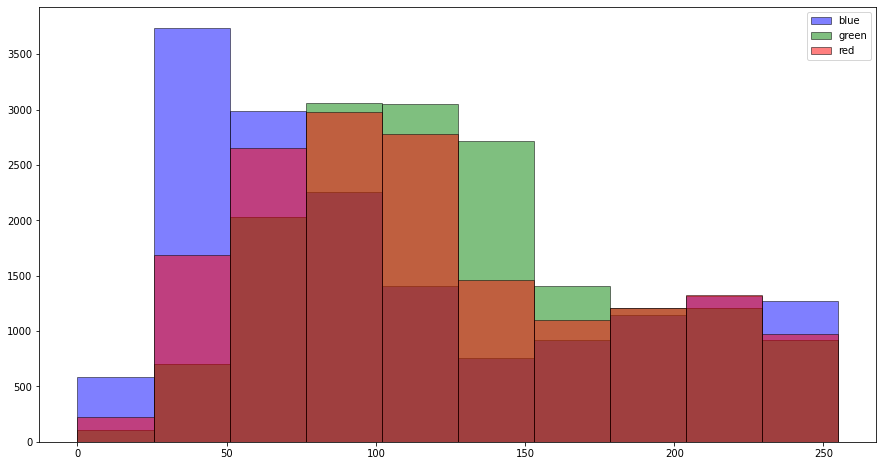

<Figure size 432x288 with 0 Axes>

In [ ]:
for species in labels.label.unique():
  plt.figure(figsize=(17,8))
  plt.suptitle(species)
  #plt.title('phlox')
  for i,im in enumerate(labels[labels.label == species].file):
    plt.subplot(5,6,i+1)
    img = cv.imread('/content/flower_images/' + im)
    img = cv.cvtColor(img, cv.COLOR_BGR2RGB)
    plt.title(im)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(img)
  for i,im in enumerate(labels[labels.label == species].file):    
    red=np.array([])
    green=np.array([])
    blue=np.array([])
    img = cv.imread('/content/flower_images/' + im)
    img = cv.cvtColor(img, cv.COLOR_BGR2RGB)
    if im == "0208.png":
      img = cv.resize(img, (128,128))
    red=np.append(red,cv.split(img)[0].reshape(128*128,1))
    green=np.append(green,cv.split(img)[1].reshape(128*128,1))
    blue=np.append(blue,cv.split(img)[2].reshape(128*128,1))
  plt.figure(figsize=(15,8))
  plt.hist(blue,color="blue",bins=10,edgecolor='k',alpha=0.5,label="blue")
  plt.hist(green,color="green",bins=10,edgecolor='k',alpha=0.5,label="green")
  plt.hist(red,color="red",bins=10,edgecolor='k',alpha=0.5,label="red")
  plt.legend()
  plt.show()
  plt.tight_layout();

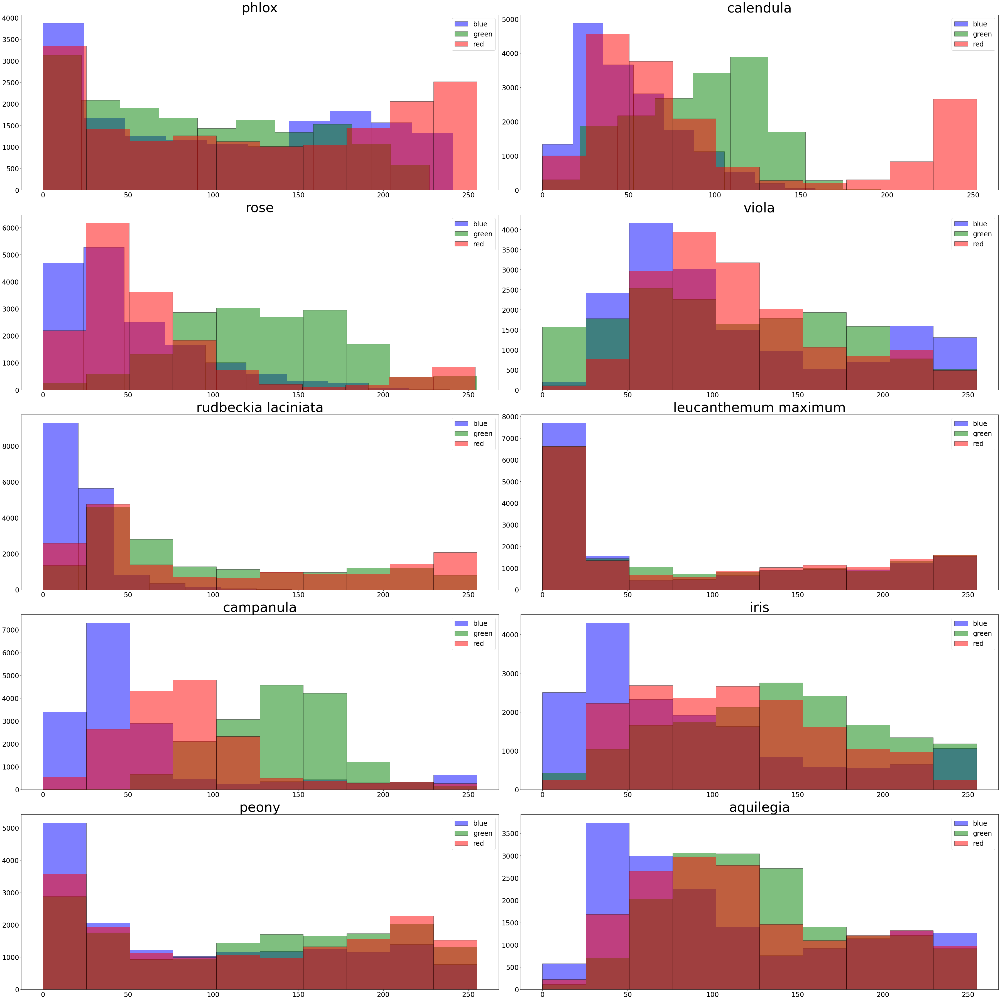

In [ ]:
plt.figure(figsize=(50,50))
for j,species in enumerate(labels.label.unique()):
  #plt.suptitle(species)
  plt.subplot(5,2,j+1)
  
  plt.title(species, fontdict = {'fontsize': 48})
  for i,im in enumerate(labels[labels.label == species].file):    
    red=np.array([])
    green=np.array([])
    blue=np.array([])
    img = cv.imread('/content/flower_images/' + im)
    img = cv.cvtColor(img, cv.COLOR_BGR2RGB)
    if im == "0208.png":
      img = cv.resize(img, (128,128))
    red=np.append(red,cv.split(img)[0].reshape(128*128,1))
    green=np.append(green,cv.split(img)[1].reshape(128*128,1))
    blue=np.append(blue,cv.split(img)[2].reshape(128*128,1))
  #plt.figure(figsize=(15,8))
  plt.hist(blue,color="blue",bins=10,edgecolor='k',alpha=0.5,label="blue")
  plt.hist(green,color="green",bins=10,edgecolor='k',alpha=0.5,label="green")
  plt.hist(red,color="red",bins=10,edgecolor='k',alpha=0.5,label="red")
  #plt.hist((red,green,blue),color=("red","green","blue"),bins=10,edgecolor='k',alpha=0.5,label=("red","green","blue"))
  plt.xticks(fontsize = 24)
  plt.yticks(fontsize = 24)
  plt.legend(fontsize = 24)
  #plt.show()
  plt.tight_layout();

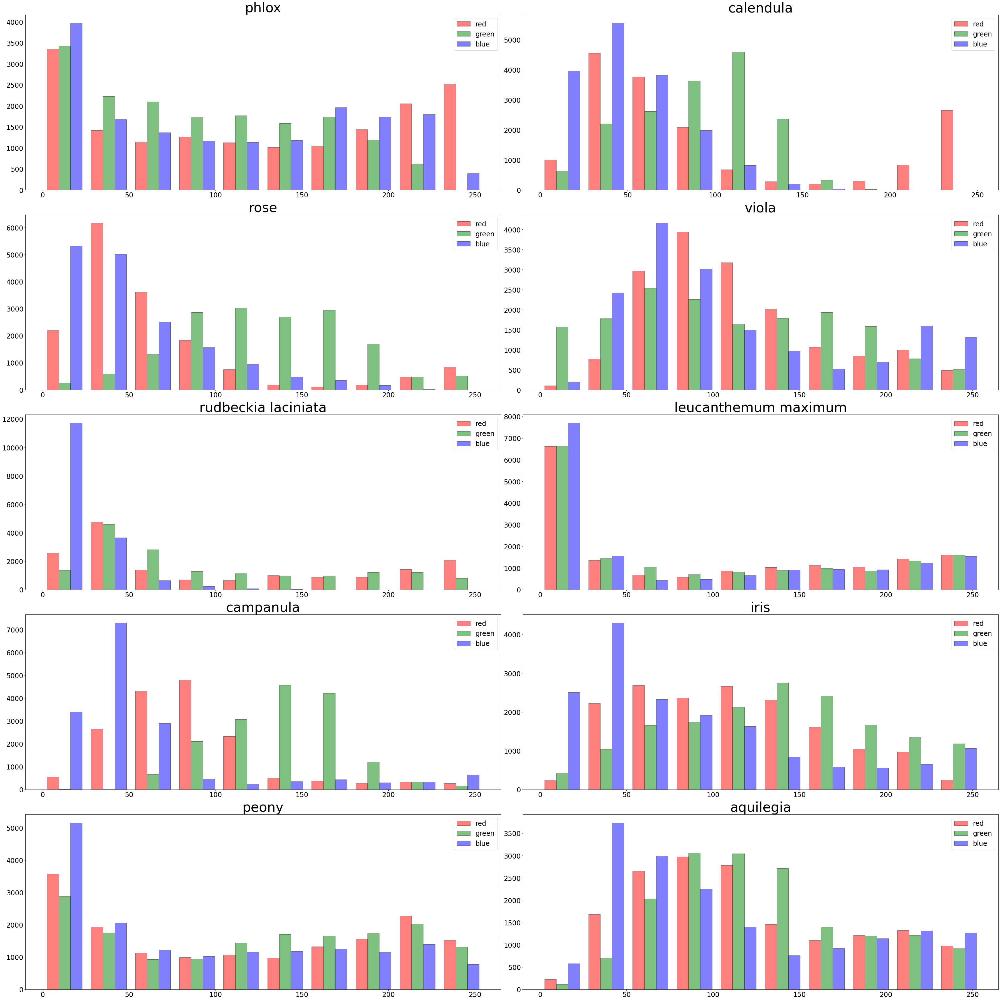

In [ ]:
plt.figure(figsize=(50,50))
for j,species in enumerate(labels.label.unique()):
  #plt.suptitle(species)
  plt.subplot(5,2,j+1)
  
  plt.title(species, fontdict = {'fontsize': 48})
  for i,im in enumerate(labels[labels.label == species].file):    
    red=np.array([])
    green=np.array([])
    blue=np.array([])
    img = cv.imread('/content/flower_images/' + im)
    img = cv.cvtColor(img, cv.COLOR_BGR2RGB)
    if im == "0208.png":
      img = cv.resize(img, (128,128))
    red=np.append(red,cv.split(img)[0].reshape(128*128,1))
    green=np.append(green,cv.split(img)[1].reshape(128*128,1))
    blue=np.append(blue,cv.split(img)[2].reshape(128*128,1))
  #plt.figure(figsize=(15,8))
  #plt.hist(blue,color="blue",bins=10,edgecolor='k',alpha=0.5,label="blue")
  #plt.hist(green,color="green",bins=10,edgecolor='k',alpha=0.5,label="green")
  #plt.hist(red,color="red",bins=10,edgecolor='k',alpha=0.5,label="red")
  plt.hist((red,green,blue),color=("red","green","blue"),bins=10,edgecolor='k',alpha=0.5,label=("red","green","blue"))
  plt.xticks(fontsize = 24)
  plt.yticks(fontsize = 24)
  plt.legend(fontsize = 24)
  #plt.show()
  plt.tight_layout();